In [35]:
import tensorflow as tf
import numpy as np
import sys, os
sys.path.append("..")
import tools
import json
import matplotlib.pyplot as plt
import math

In [36]:
def create_XY_pairs(dataset_path):
    dataset_test = tf.data.TFRecordDataset([dataset_path])
    tfrecord_shape = tools.model.get_shape_of_quadratic_image_tfrecord(dataset_test)
    dataset_test = dataset_test.map(tools.model.parse_function(img_shape=tfrecord_shape, test=False))
    dataset_test_x= dataset_test.map(lambda x,y: x)
    dataset_test_y= dataset_test.map(lambda x,y: y)
    #dataset_test_x, dataset_test_y = tfdataset_merge(dataset_test, (4176, 2048))
    inputs = tools.data.dataset_to_numpy(dataset_test_x)
    truths = tools.data.dataset_to_numpy(dataset_test_y)
    return inputs, truths

x,y = create_XY_pairs('../DATA/test1.tfrecord')

In [75]:
newsize = 32
layer_resize_x_bl = tf.keras.layers.Resizing(height=newsize, width=newsize, interpolation="bilinear")(x).numpy()
layer_resize_x_ne = tf.keras.layers.Resizing(height=newsize, width=newsize, interpolation="nearest")(x).numpy()
layer_resize_x_bc = tf.keras.layers.Resizing(height=newsize, width=newsize, interpolation="bicubic")(x).numpy()
layer_resize_x_l3 = tf.keras.layers.Resizing(height=newsize, width=newsize, interpolation="lanczos3")(x).numpy()
layer_resize_x_l5 = tf.keras.layers.Resizing(height=newsize, width=newsize, interpolation="lanczos5")(x).numpy()
maxpool_resize_x = x
avgpool_resize_x = x
for _ in range(int(math.log(x.shape[1],2)) - int(math.log(newsize,2))):
    maxpool_resize_x = tf.keras.layers.MaxPool2D()(maxpool_resize_x).numpy()
    avgpool_resize_x = tf.keras.layers.AveragePooling2D()(avgpool_resize_x).numpy()

In [102]:
y_resize = y
for _ in range(int(math.log(y.shape[1],2)) - int(math.log(newsize,2))):
    y_resize = tf.keras.layers.AveragePooling2D()(y_resize).numpy()
y_resize = np.round(y_resize)

In [104]:
y_resize = np.ceil(tf.keras.layers.Resizing(height=newsize, width=newsize, interpolation="bilinear")(y).numpy())

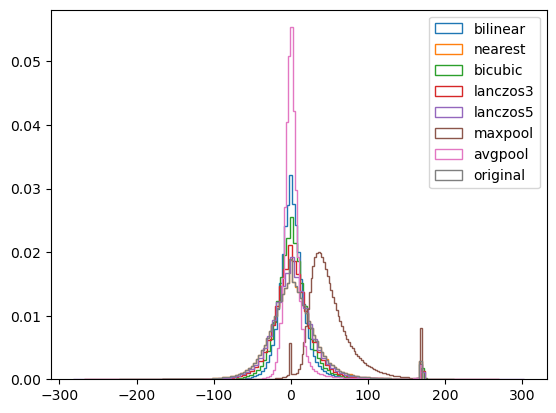

In [119]:
fig, ax = plt.subplots()
bins=100
_ = ax.hist(layer_resize_x_bl.flatten(),bins=bins, histtype='step', label = "bilinear", density=True)
_ = ax.hist(layer_resize_x_ne.flatten(),bins=bins, histtype='step', label = "nearest", density=True)
_ = ax.hist(layer_resize_x_bc.flatten(),bins=bins, histtype='step', label = "bicubic", density=True)
_ = ax.hist(layer_resize_x_l3.flatten(),bins=bins, histtype='step', label = "lanczos3", density=True)
_ = ax.hist(layer_resize_x_l5.flatten(),bins=bins, histtype='step', label = "lanczos5", density=True)
_ = ax.hist(maxpool_resize_x.flatten(),bins=bins, histtype='step', label = "maxpool", density=True)
_ = ax.hist(avgpool_resize_x.flatten(),bins=bins, histtype='step', label = "avgpool", density=True)
_ = ax.hist(x.flatten(),bins=bins, histtype='step', label = "original", density=True)

_ = ax.legend()

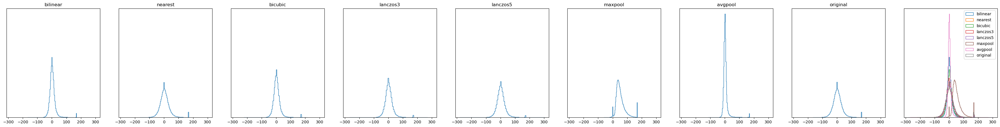

In [128]:
fig, ax = plt.subplots(1,9, figsize=(5*9, 5), sharey=True, sharex=True)
bins=100
for a in ax:
    a.set_yticks([])
        
_ = ax[0].hist(layer_resize_x_bl.flatten(),bins=bins, histtype='step', label = "bilinear", density=True)
_ = ax[0].set_title("bilinear")

_ = ax[1].hist(layer_resize_x_ne.flatten(),bins=bins, histtype='step', label = "nearest", density=True)
_ = ax[1].set_title("nearest")

_ = ax[2].hist(layer_resize_x_bc.flatten(),bins=bins, histtype='step', label = "bicubic", density=True)
_ = ax[2].set_title("bicubic")

_ = ax[3].hist(layer_resize_x_l3.flatten(),bins=bins, histtype='step', label = "lanczos3", density=True)
_ = ax[3].set_title("lanczos3")

_ = ax[4].hist(layer_resize_x_l5.flatten(),bins=bins, histtype='step', label = "lanczos5", density=True)
_ = ax[4].set_title("lanczos5")

_ = ax[5].hist(maxpool_resize_x.flatten(),bins=bins, histtype='step', label = "maxpool", density=True)
_ = ax[5].set_title("maxpool")

_ = ax[6].hist(avgpool_resize_x.flatten(),bins=bins, histtype='step', label = "avgpool", density=True)
_ = ax[6].set_title("avgpool")

_ = ax[7].hist(x.flatten(),bins=bins, histtype='step', label = "original", density=True)
_ = ax[7].set_title("original")

_ = ax[8].hist(layer_resize_x_bl.flatten(),bins=bins, histtype='step', label = "bilinear", density=True)
_ = ax[8].hist(layer_resize_x_ne.flatten(),bins=bins, histtype='step', label = "nearest", density=True)
_ = ax[8].hist(layer_resize_x_bc.flatten(),bins=bins, histtype='step', label = "bicubic", density=True)
_ = ax[8].hist(layer_resize_x_l3.flatten(),bins=bins, histtype='step', label = "lanczos3", density=True)
_ = ax[8].hist(layer_resize_x_l5.flatten(),bins=bins, histtype='step', label = "lanczos5", density=True)
_ = ax[8].hist(maxpool_resize_x.flatten(),bins=bins, histtype='step', label = "maxpool", density=True)
_ = ax[8].hist(avgpool_resize_x.flatten(),bins=bins, histtype='step', label = "avgpool", density=True)
_ = ax[8].hist(x.flatten(),bins=bins, histtype='step', label = "original", density=True)
_ = ax[8].legend()

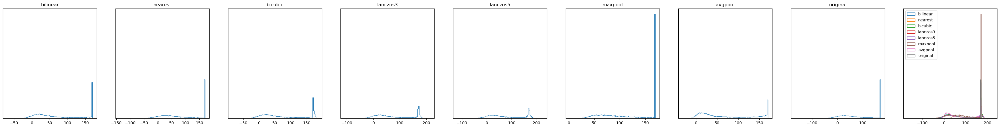

In [131]:
fig, ax = plt.subplots(1,9, figsize=(5*9, 5), sharey=True)
bins=100
for a in ax:
    a.set_yticks([])
        
_ = ax[0].hist(layer_resize_x_bl[y_resize!=0].flatten(),bins=bins, histtype='step', label = "bilinear", density=True)
_ = ax[0].set_title("bilinear")

_ = ax[1].hist(layer_resize_x_ne[y_resize!=0].flatten(),bins=bins, histtype='step', label = "nearest", density=True)
_ = ax[1].set_title("nearest")

_ = ax[2].hist(layer_resize_x_bc[y_resize!=0].flatten(),bins=bins, histtype='step', label = "bicubic", density=True)
_ = ax[2].set_title("bicubic")

_ = ax[3].hist(layer_resize_x_l3[y_resize!=0].flatten(),bins=bins, histtype='step', label = "lanczos3", density=True)
_ = ax[3].set_title("lanczos3")

_ = ax[4].hist(layer_resize_x_l5[y_resize!=0].flatten(),bins=bins, histtype='step', label = "lanczos5", density=True)
_ = ax[4].set_title("lanczos5")

_ = ax[5].hist(maxpool_resize_x[y_resize!=0].flatten(),bins=bins, histtype='step', label = "maxpool", density=True)
_ = ax[5].set_title("maxpool")

_ = ax[6].hist(avgpool_resize_x[y_resize!=0].flatten(),bins=bins, histtype='step', label = "avgpool", density=True)
_ = ax[6].set_title("avgpool")

_ = ax[7].hist(x[y!=0].flatten(),bins=bins, histtype='step', label = "original", density=True)
_ = ax[7].set_title("original")

_ = ax[8].hist(layer_resize_x_bl[y_resize!=0].flatten(),bins=bins, histtype='step', label = "bilinear", density=True)
_ = ax[8].hist(layer_resize_x_ne[y_resize!=0].flatten(),bins=bins, histtype='step', label = "nearest", density=True)
_ = ax[8].hist(layer_resize_x_bc[y_resize!=0].flatten(),bins=bins, histtype='step', label = "bicubic", density=True)
_ = ax[8].hist(layer_resize_x_l3[y_resize!=0].flatten(),bins=bins, histtype='step', label = "lanczos3", density=True)
_ = ax[8].hist(layer_resize_x_l5[y_resize!=0].flatten(),bins=bins, histtype='step', label = "lanczos5", density=True)
_ = ax[8].hist(maxpool_resize_x[y_resize!=0].flatten(),bins=bins, histtype='step', label = "maxpool", density=True)
_ = ax[8].hist(avgpool_resize_x[y_resize!=0].flatten(),bins=bins, histtype='step', label = "avgpool", density=True)
_ = ax[8].hist(x[y!=0].flatten(),bins=bins, histtype='step', label = "original", density=True)
_ = ax[8].legend()

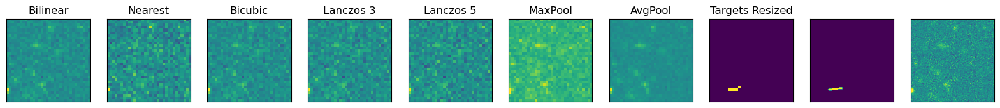

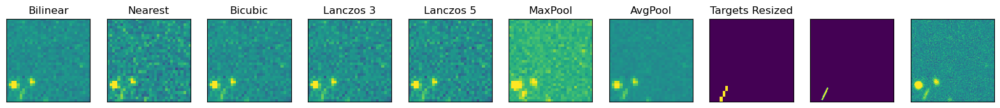

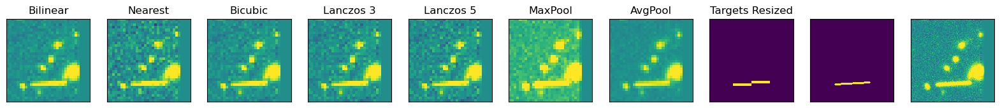

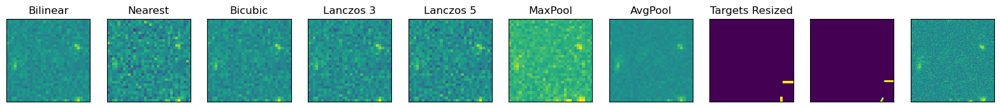

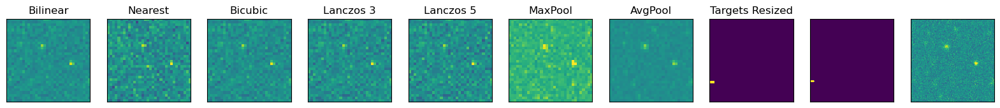

...

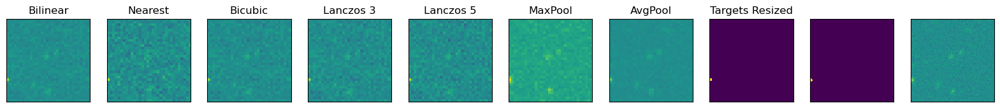

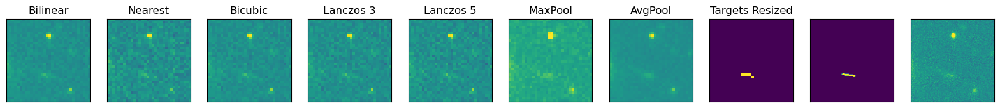

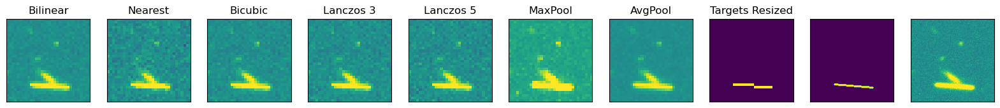

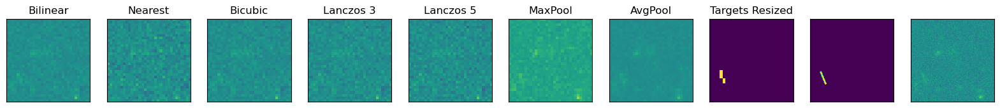

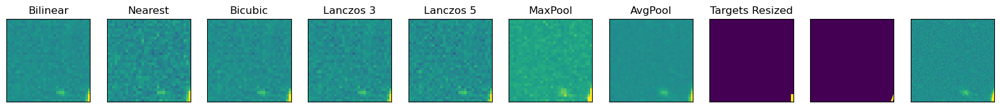

In [105]:
k = np.unique(np.where(y!=0)[0])[:100]
norm_min = x.min()
norm_max = x.max()
for i in k:
    fig, ax = plt.subplots(1, 10, figsize=(10*2,2))
    for a in ax:
        a.set_xticks([])
        a.set_yticks([])
    ax[0].imshow(layer_resize_x_bl[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[0].set_title("Bilinear")
    
    ax[1].imshow(layer_resize_x_ne[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[1].set_title("Nearest")
    
    ax[2].imshow(layer_resize_x_bc[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[2].set_title("Bicubic")
    
    ax[3].imshow(layer_resize_x_l3[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[3].set_title("Lanczos 3")
    
    ax[4].imshow(layer_resize_x_l5[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[4].set_title("Lanczos 5")
    
    ax[5].imshow(maxpool_resize_x[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[5].set_title("MaxPool")
    
    ax[6].imshow(avgpool_resize_x[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    ax[6].set_title("AvgPool")
    
    ax[7].imshow(y_resize[i, :, :, 0])
    ax[7].set_title("Targets Resized")
    
    ax[8].imshow(y[i, :, :, 0])
    ax[9].imshow(x[i, :, :, 0], vmin=norm_min, vmax=norm_max)
    plt.show()

In [2]:
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape, Dense, multiply, Permute, Concatenate, \
    Conv2D, Add, Activation, Lambda
from tensorflow.keras import backend as K
from tensorflow.keras.activations import sigmoid


def attach_attention_module(net, attention_module):
    if attention_module == 'se_block':  # SE_block
        net = se_block(net)
    elif attention_module == 'cbam_block':  # CBAM_block
        net = cbam_block(net)
    else:
        raise Exception("'{}' is not supported attention module!".format(attention_module))

    return net


def se_block(input_feature, ratio=8):
    """Contains the implementation of Squeeze-and-Excitation(SE) block.
    As described in https://arxiv.org/abs/1709.01507.
    """

    channel_axis = 1 if K.image_data_format() == "channels_first" else -1
    channel = input_feature.shape[channel_axis]

    se_feature = GlobalAveragePooling2D()(input_feature)
    se_feature = Reshape((1, 1, channel))(se_feature)
    assert se_feature.shape[1:] == (1, 1, channel)
    se_feature = Dense(channel // ratio,
                       activation='relu',
                       kernel_initializer='he_normal',
                       use_bias=True,
                       bias_initializer='zeros')(se_feature)
    assert se_feature.shape[1:] == (1, 1, channel // ratio)
    se_feature = Dense(channel,
                       activation='sigmoid',
                       kernel_initializer='he_normal',
                       use_bias=True,
                       bias_initializer='zeros')(se_feature)
    assert se_feature.shape[1:] == (1, 1, channel)
    if K.image_data_format() == 'channels_first':
        se_feature = Permute((3, 1, 2))(se_feature)

    se_feature = multiply([input_feature, se_feature])
    return se_feature


def cbam_block(cbam_feature, ratio=8):
    """Contains the implementation of Convolutional Block Attention Module(CBAM) block.
    As described in https://arxiv.org/abs/1807.06521.
    """

    cbam_feature = channel_attention(cbam_feature, ratio)
    #cbam_feature = spatial_attention(cbam_feature)
    return cbam_feature


def channel_attention(input_feature, ratio=8):
    channel_axis = 1 if K.image_data_format() == "channels_first" else -1
    channel = input_feature.shape[channel_axis]

    shared_layer_one = Dense(channel // ratio,
                             activation='relu',
                             kernel_initializer='he_normal',
                             use_bias=True,
                             bias_initializer='zeros')
    shared_layer_two = Dense(channel,
                             kernel_initializer='he_normal',
                             use_bias=True,
                             bias_initializer='zeros')

    avg_pool = GlobalAveragePooling2D()(input_feature)
    avg_pool = Reshape((1, 1, channel))(avg_pool)
    assert avg_pool.shape[1:] == (1, 1, channel)
    avg_pool = shared_layer_one(avg_pool)
    assert avg_pool.shape[1:] == (1, 1, channel // ratio)
    avg_pool = shared_layer_two(avg_pool)
    assert avg_pool.shape[1:] == (1, 1, channel)

    max_pool = GlobalMaxPooling2D()(input_feature)
    max_pool = Reshape((1, 1, channel))(max_pool)
    assert max_pool.shape[1:] == (1, 1, channel)
    max_pool = shared_layer_one(max_pool)
    assert max_pool.shape[1:] == (1, 1, channel // ratio)
    max_pool = shared_layer_two(max_pool)
    assert max_pool.shape[1:] == (1, 1, channel)

    cbam_feature = Add()([avg_pool, max_pool])
    cbam_feature = Activation('sigmoid')(cbam_feature)

    if K.image_data_format() == "channels_first":
        cbam_feature = Permute((3, 1, 2))(cbam_feature)

    return multiply([input_feature, cbam_feature])


def spatial_attention(input_feature):
    kernel_size = 7

    if K.image_data_format() == "channels_first":
        channel = input_feature.shape[1]
        cbam_feature = Permute((2, 3, 1))(input_feature)
    else:
        channel = input_feature.shape[-1]
        cbam_feature = input_feature

    avg_pool = Lambda(lambda x: K.mean(x, axis=3, keepdims=True))(cbam_feature)
    assert avg_pool.shape[-1] == 1
    max_pool = Lambda(lambda x: K.max(x, axis=3, keepdims=True))(cbam_feature)
    assert max_pool.shape[-1] == 1
    concat = Concatenate(axis=3)([avg_pool, max_pool])
    assert concat.shape[-1] == 2
    cbam_feature = Conv2D(filters=1,
                          kernel_size=kernel_size,
                          strides=1,
                          padding='same',
                          activation='sigmoid',
                          kernel_initializer='he_normal',
                          use_bias=False)(concat)
    assert cbam_feature.shape[-1] == 1

    if K.image_data_format() == "channels_first":
        cbam_feature = Permute((3, 1, 2))(cbam_feature)

    return multiply([input_feature, cbam_feature])



In [3]:
def attention_gate(g, s, num_filters, kernel_size=1, name=""):
    wg = tf.keras.layers.Conv2D(num_filters, kernel_size, padding="same", name="attention" + name + "_sconv")(g)
    wg = tf.keras.layers.BatchNormalization(name="attention" + name + "_snorm")(wg)

    ws = tf.keras.layers.Conv2D(num_filters, kernel_size, padding="same", name="attention" + name + "_gconv")(s)
    ws = tf.keras.layers.BatchNormalization(name="attention" + name + "_gnorm")(ws)

    out = tf.keras.layers.add([wg, ws], name="attention" + name + "_sum")
    #out = tf.keras.layers.BatchNormalization(name="attention" + name + "_sum_norm")(out)
    out = tf.keras.layers.Activation("relu", name="attention" + name + "_relu")(out)
    out = tf.keras.layers.Conv2D(num_filters, kernel_size, padding="same", name="attention" + name + "_conv")(out)
    out = tf.keras.layers.BatchNormalization(name="attention" + name + "_norm")(out)
    out = tf.keras.layers.Activation("sigmoid", name="attention" + name + "_sigmoid")(out)

    #s = tf.keras.layers.DepthwiseConv2D(kernel_size+2, activation="sigmoid", padding="same", name="attention" + name + "_depthwise")(s)
    out = tf.keras.layers.multiply([out, s], name="attention" + name + "_multiply")
    return out


def encoder_mini_block(inputs, n_filters=32, kernel_size=3, activation="relu", dropout_prob=0.3, max_pooling=True,
                       attention=True, name=""):
    """
    Encoder mini block for U-Net architecture. It consists of two convolutional layers with the same activation function
    and number of filters. Optionally, a dropout layer can be added after the second convolutional layer. If max_pooling
    is set to True, a max pooling layer is added at the end of the block. The skip connection is the output of the second
    convolutional layer.

    :param inputs: Input tensor to the block
    :param n_filters: Number of filters for the convolutional layers
    :param activation: Activation function for the convolutional layers
    :param dropout_prob: Dropout probability for the dropout layer (0 means no dropout)
    :param max_pooling: Boolean to add a max pooling layer at the end of the block
    :param name: Name of the block (Optional)
    :return: The output tensor of the block and the skip connection tensor
    """

    conv = tf.keras.layers.Conv2D(n_filters,
                                  kernel_size,  # filter size
                                  strides=1,
                                  activation="linear",
                                  padding='same',
                                  kernel_initializer='HeNormal',
                                  name="eblock" + name + "_conv1")(inputs)

    conv = tf.keras.layers.BatchNormalization(name="eblock" + name + "_norm1")(conv)
    conv = tf.keras.layers.Activation(activation=activation, name="eblock" + name + "_" + activation + "1")(conv)

    conv = tf.keras.layers.Conv2D(n_filters,
                                  kernel_size,  # filter size
                                  strides=1,
                                  activation="linear",
                                  padding='same',
                                  kernel_initializer='HeNormal',
                                  name="eblock" + name + "_conv2")(conv)
    conv = tf.keras.layers.BatchNormalization(name="eblock" + name + "_norm2")(conv)
    conv = tf.keras.layers.Activation(activation=activation, name="eblock" + name + "_" + activation + "2")(conv)
    if attention:
        conv = attach_attention_module(conv, "cbam_block")

    if dropout_prob > 0:
        conv = tf.keras.layers.Dropout(dropout_prob, name="eblock" + name + "_dropout")(conv)
    if max_pooling:
        next_layer = tf.keras.layers.MaxPooling2D(pool_size=(2, 2), name="eblock" + name + "_pool")(conv)
    else:
        next_layer = conv
    skip_connection = conv
    return next_layer, skip_connection


def decoder_mini_block(prev_layer_input, skip_layer_input=None, n_filters=32, kernel_size=3, activation="relu", dropout_prob=0.3,
                       max_pooling=True, attention=True, name=""):
    """
    Decoder mini block for U-Net architecture that consists of a transposed convolutional layer followed by two
    convolutional layers. The skip connection is the concatenation of the transposed convolutional layer and the
    corresponding encoder skip connection.

    :param prev_layer_input: Input tensor to the block from the previous layer
    :param skip_layer_input: Input tensor to the block from the corresponding encoder skip connection
    :param n_filters: Number of filters for the convolutional layers
    :param activation: Activation function for the convolutional layers
    :param name: Name of the block (Optional)
    :return: The output tensor of the block
    """
    if max_pooling:
        prev_layer_input = tf.keras.layers.Conv2DTranspose(skip_layer_input.shape[-1], strides=2, padding='same',
                                                          kernel_size=kernel_size, name="dblock" + name + "_upsampling")(prev_layer_input)
        prev_layer_input = tf.keras.layers.BatchNormalization(name="dblock" + name + "_norm0")(prev_layer_input)
        prev_layer_input = tf.keras.layers.Activation(activation=activation,
                                                      name="dblock" + name + "_" + activation + "0")(prev_layer_input)
    if skip_layer_input is not None:
        skip_layer_input = attention_gate(prev_layer_input, skip_layer_input, skip_layer_input.shape[-1], name=name)
        merge = tf.keras.layers.concatenate([prev_layer_input, skip_layer_input], name="dblock" + name + "_merge")
    else:
        merge = prev_layer_input
    conv = tf.keras.layers.Conv2D(n_filters,
                                  kernel_size,  # filter size
                                  strides=1,
                                  activation="linear",
                                  padding='same',
                                  kernel_initializer='HeNormal',
                                  name="dblock" + name + "_conv1")(merge)
    conv = tf.keras.layers.BatchNormalization(name="dblock" + name + "_norm1")(conv)
    conv = tf.keras.layers.Activation(activation=activation, name="dblock" + name + "_" + activation + "1")(conv)

    conv = tf.keras.layers.Conv2D(n_filters,
                                  kernel_size,  # filter size
                                  strides=1,
                                  activation="linear",
                                  padding='same',
                                  kernel_initializer='HeNormal',
                                  name="dblock" + name + "_conv2")(conv)
    conv = tf.keras.layers.BatchNormalization(name="dblock" + name + "_norm2")(conv)
    conv = tf.keras.layers.Activation(activation=activation, name="dblock" + name + "_" + activation + "2")(conv)
    if attention:
        conv = attach_attention_module(conv, "cbam_block")
    if dropout_prob > 0:
        conv = tf.keras.layers.Dropout(dropout_prob, name="dblock" + name + "_dropout")(conv)

    return conv


def unet_model(input_size, arhitecture, kernel_size=3, multi_input=True):
    """
    U-Net model for semantic segmentation. The model consists of an encoder and a decoder. The encoder downsamples the
    input image and extracts features. The decoder upsamples the features and generates the segmentation mask. Skip
    connections are used to concatenate the encoder features with the decoder features. The model is created from the
    architecture dictionary that contains the number of filters, activation functions, dropout probabilities, and max
    pooling for each mini block.

    :param input_size: Size of the input image
    :param arhitecture: Dictionary containing the architecture of the U-Net model
    :return: U-Net model
    """
    inputs = tf.keras.layers.Input(input_size, name="input")
    layer = tf.keras.layers.BatchNormalization(name="input_normalisation")(inputs)
    skip_connections = []
    arhitecture["downMaxPool"][len(arhitecture["downFilters"])-1] = False
    # Encoder
    for i in range(len(arhitecture["downFilters"])):
        if multi_input and i!=0 and i!=len(arhitecture["downFilters"]):
            down_input = tf.keras.layers.Resizing(layer.shape[1], layer.shape[2])(inputs)
            down_input = tf.keras.layers.BatchNormalization()(down_input)
            layer = tf.keras.layers.concatenate([down_input, layer])
        layer, skip = encoder_mini_block(layer,
                                         kernel_size=kernel_size,
                                         n_filters=arhitecture["downFilters"][i],
                                         activation=arhitecture["downActivation"][i],
                                         dropout_prob=arhitecture["downDropout"][i],
                                         max_pooling=arhitecture["downMaxPool"][i],
                                         attention=False if i == 0 else True,
                                         name=str(i))
        if i != len(arhitecture["downFilters"])-1:
            skip_connections.append(skip)
        else:
            skip_connections.append(None)

    # Decoder
    for i in range(len(arhitecture["upFilters"])):
        skip_con = skip_connections[len(skip_connections) - 1 - i]
        layer = decoder_mini_block(layer,
                                   skip_con,
                                   kernel_size=kernel_size,
                                   n_filters=arhitecture["upFilters"][i],
                                   activation=arhitecture["upActivation"][i],
                                   attention=True,
                                   dropout_prob=arhitecture["upDropout"][i],
                                   max_pooling=arhitecture["downMaxPool"][len(arhitecture["downMaxPool"]) - 1 - i],
                                   name=str(len(arhitecture["upFilters"]) - 1 - i))

    outputs = tf.keras.layers.Conv2D(1, kernel_size, padding='same', name="output_conv")(layer)
    #outputs = tf.keras.layers.LayerNormalization(name="output_norm")(outputs)
    outputs = tf.keras.layers.Activation(activation="sigmoid", name="output_sigmoid")(outputs)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs], name="AsteroidNET")
    return model

In [ ]:
args_arhitecture = "../DATA/arhitecture_tuned.json"
args_train_dataset_path = '../DATA/train1.tfrecord'
args_test_dataset_path = '../DATA/test1.tfrecord'
args_kernel_size = 3
args_start_lr = 0.001
args_alpha = 0.9
args_gamma = 3
args_batch_size = 64
args_decay_lr_rate = 0.75
args_decay_lr_patience = 10
args_epochs = 128


mirrored_strategy = tf.distribute.MirroredStrategy()
task_type, task_id = (None, None)
with open(args_arhitecture) as f:
    arhitecture = json.load(f)
if "0" in arhitecture.keys():
    arhitecture = arhitecture["0"]

dataset_train = tf.data.TFRecordDataset([args_train_dataset_path])
tfrecord_shape = tools.model.get_shape_of_quadratic_image_tfrecord(dataset_train)
dataset_train = dataset_train.map(tools.model.parse_function(img_shape=tfrecord_shape, test=False))
dataset_val = tf.data.TFRecordDataset([args_test_dataset_path])
dataset_val = dataset_val.map(tools.model.parse_function(img_shape=tfrecord_shape, test=False))
    
with mirrored_strategy.scope():
    model = unet_model(tfrecord_shape, arhitecture, kernel_size=args_kernel_size)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=args_start_lr),
                  loss=tools.metrics.FocalTversky(alpha=args_alpha, gamma=args_gamma),
                  metrics=["Precision", "Recall", tools.metrics.F1_Score()])

if tuple(model.outputs[0].shape[1:]) != tfrecord_shape:
    dataset_train = dataset_train.map(tools.model.reshape_outputs(img_shape=tuple(model.outputs[0].shape[1:-1])))
    dataset_val = dataset_val.map(tools.model.reshape_outputs(img_shape=tuple(model.outputs[0].shape[1:-1])))

dataset_train = dataset_train.shuffle(1000).batch(args_batch_size).prefetch(10)
dataset_val = dataset_val.batch(args_batch_size).prefetch(10)

terminateonnan_kb = tf.keras.callbacks.TerminateOnNaN()
reducelronplateau_kb = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=args_decay_lr_rate,
                                                            patience=2 * args_decay_lr_patience,
                                                            cooldown=args_decay_lr_patience,
                                                            verbose=1)
kb = [terminateonnan_kb, reducelronplateau_kb]
results = model.fit(dataset_train, epochs=args_epochs, validation_data=dataset_val, callbacks=kb, verbose=1)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensor

I0000 00:00:1717067583.001641   21697 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1452/1452 [==============================] - 2409s 2s/step - loss: 0.9860 - precision: 2.3598e-04 - recall: 1.2670e-04 - f1_score: 3.2459e-07 - val_loss: 0.9856 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0000e+00 - lr: 0.0010
Epoch 2/128
   8/1452 [..............................] - ETA: 35:26 - loss: 0.9877 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0000e+00